In [240]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [180]:
df = pd.read_csv("https://raw.githubusercontent.com/Rahulrex069/Datatrained-Projects/main/Evaluation%20Project%20Week1/WA_Fn-UseC_-HR-Employee-Attrition.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [181]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

There are no missing values in the dataset. Hence we dont have to worry about data imputation.

In [182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [183]:
df["Attrition"].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

The problem statement here is to understand why employees are leaving and build a classification model predicting whether the employee with certain features will leave to stay, meaning should company invest more on that particular employee or not.

I also noticed that there only 237 cases where employee has left compared to 1233 who has not, creating a problem of class imbalance. Hence we need to balance the classes so that the model can learn better.

In [184]:
df["EmployeeCount"].value_counts() 

1    1470
Name: EmployeeCount, dtype: int64

In [185]:
df["StandardHours"].value_counts()

80    1470
Name: StandardHours, dtype: int64

In [186]:
df["Over18"].value_counts()

Y    1470
Name: Over18, dtype: int64

These three column has single value which not of any use in model. Hence we will drop it.

In [187]:
df.drop(["StandardHours"], axis=1, inplace=True)
df.drop(["EmployeeCount"], axis=1, inplace=True)
df.drop(["Over18"], axis=1, inplace=True)
df.drop(["EmployeeNumber"], axis=1, inplace=True)

In [188]:
df["OverTime"].value_counts()

No     1054
Yes     416
Name: OverTime, dtype: int64

In [189]:
df["BusinessTravel"].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

In [190]:
df["Department"].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

In [191]:
df["EducationField"].value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

In [192]:
df["Gender"].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

In [193]:
df["JobRole"].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

In [194]:
df["MaritalStatus"].value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

# Data Visualization

Check the TotalWorkingYears,  YearsAtCompany Vs. Attrition

YearsInCurrentRole vs. attrition


YearsWithCurrManager vs. attrition

<AxesSubplot:xlabel='BusinessTravel', ylabel='count'>

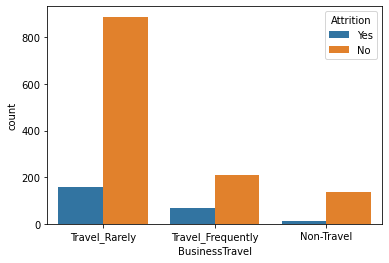

In [196]:
sns.countplot(x = 'BusinessTravel', hue='Attrition', data=df)

<AxesSubplot:xlabel='Department', ylabel='count'>

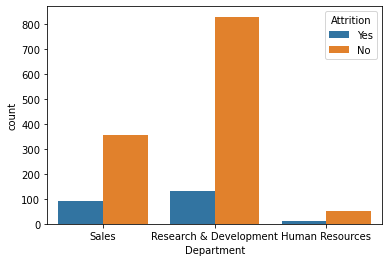

In [197]:
sns.countplot(x="Department", hue="Attrition", data=df)

Sales and R&D department are having hight attrition rate but comapretively sales department is having the highest rate of attrition among all departments.

<AxesSubplot:xlabel='EducationField', ylabel='count'>

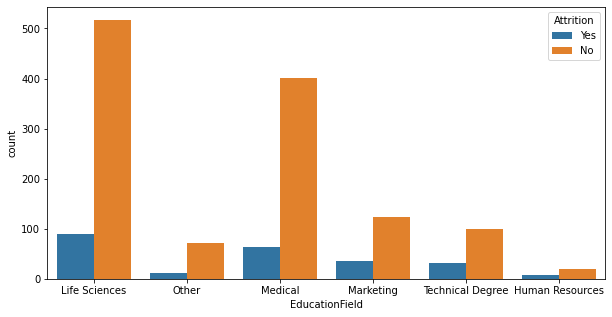

In [198]:
plt.figure(figsize=[10,5])
sns.countplot(x="EducationField", hue="Attrition", data=df)

<AxesSubplot:xlabel='Gender', ylabel='count'>

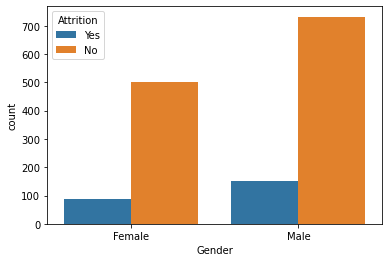

In [199]:
sns.countplot(x="Gender", hue="Attrition", data=df)

<AxesSubplot:xlabel='JobRole', ylabel='count'>

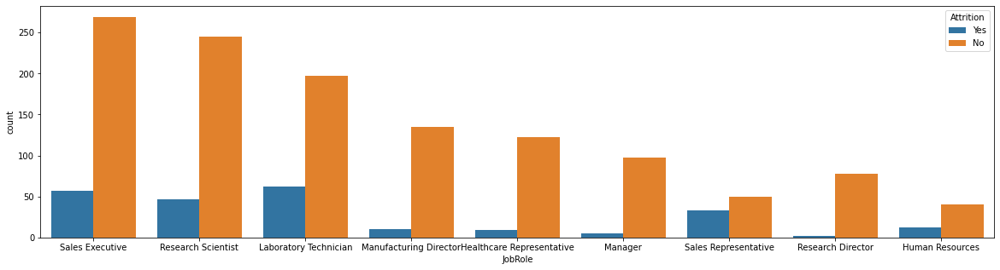

In [200]:
plt.figure(figsize=[20,5])
sns.countplot(x="JobRole", hue="Attrition", data=df)

The highest attrition we can see is under the role of Sales representative. We will see if we can get further reaon why this partcular job role have the highest attrition.

<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

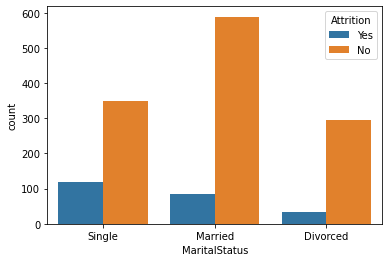

In [201]:
sns.countplot(x="MaritalStatus", hue="Attrition", data=df)

As per mertial statuses, Singles are having the highest attrition rate compared to married and Divorced people.

<AxesSubplot:xlabel='OverTime', ylabel='count'>

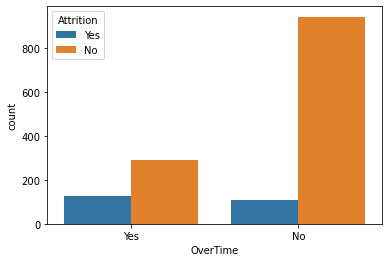

In [202]:
sns.countplot(x="OverTime", hue="Attrition", data=df)

peolpe who are doing overtime are having hight attrition rate.

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='count'>

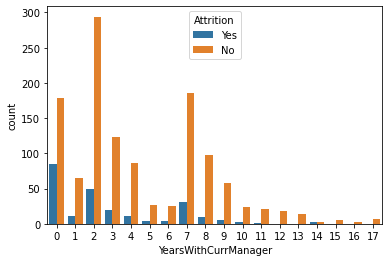

In [203]:
sns.countplot(x="YearsWithCurrManager", hue="Attrition", data=df)

It looks strange but the people under 1 year with the current Managers have the highest attrition rate. This means the people are having trouble in adjusting with their new Managers. Company should make the people familarize their employees whenever they are assigned under new managers.

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='count'>

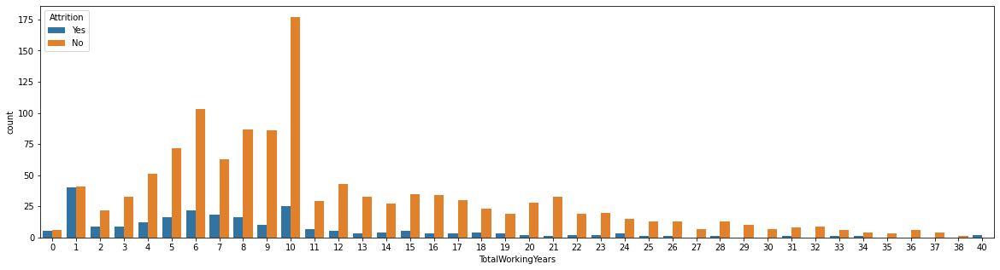

In [204]:
plt.figure(figsize=[20,5])
sns.countplot(x="TotalWorkingYears", hue="Attrition", data=df)

The plot shows that the people in their initial years are having trouble to settle themselves in the organation. As we can see, those who have spent only one years in the any company might leave the job in the search of salary hike or some other benefits.

Once they complete thaeir first year, we can see that the attrition chances are getting down. Hence while hiring new employee, company should consider that the employee should be  more then one or years their total work experiance.

<AxesSubplot:xlabel='YearsAtCompany', ylabel='count'>

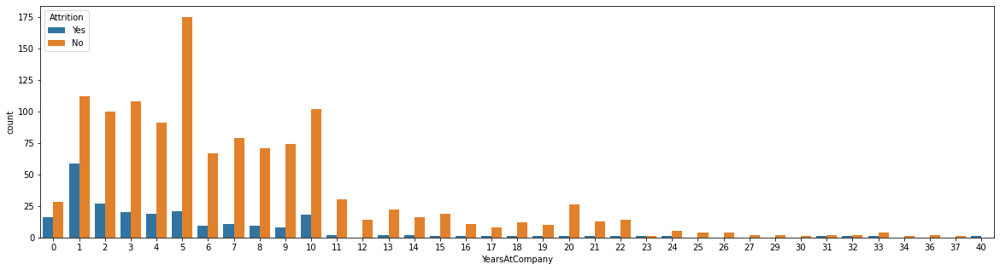

In [205]:
plt.figure(figsize=[20,5])
sns.countplot(x="YearsAtCompany", hue="Attrition", data=df)

People who are only 1 year old at the company have the highest tendency to leave. The tendency reducing over a period of time. As we can see, in 5th year, the rate of attrition is the least meaning once anyone complete 5 years in the company, until and unless there is strong reason to leave, they will not leave. 

In [206]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [207]:
df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobSatisfaction            -0.329672
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
dtype: float64

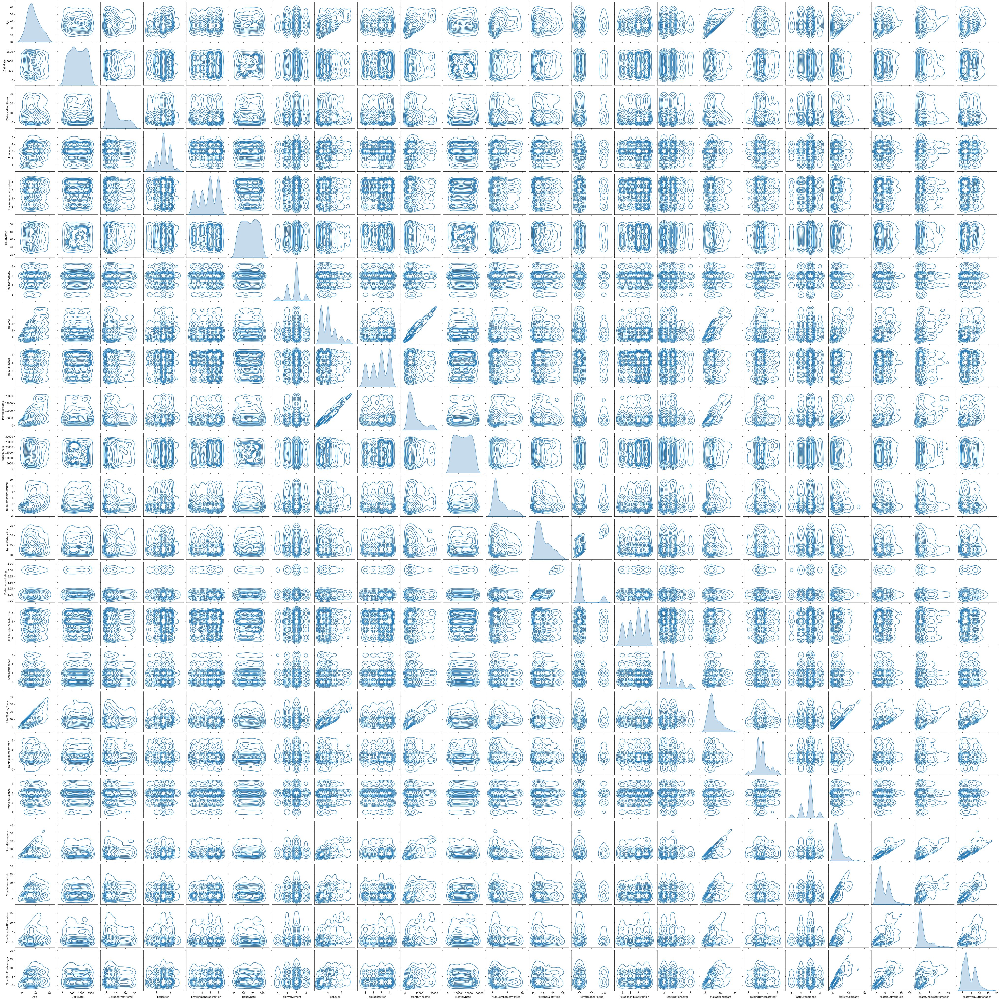

In [208]:
sns.pairplot(df, kind='kde')

<AxesSubplot:>

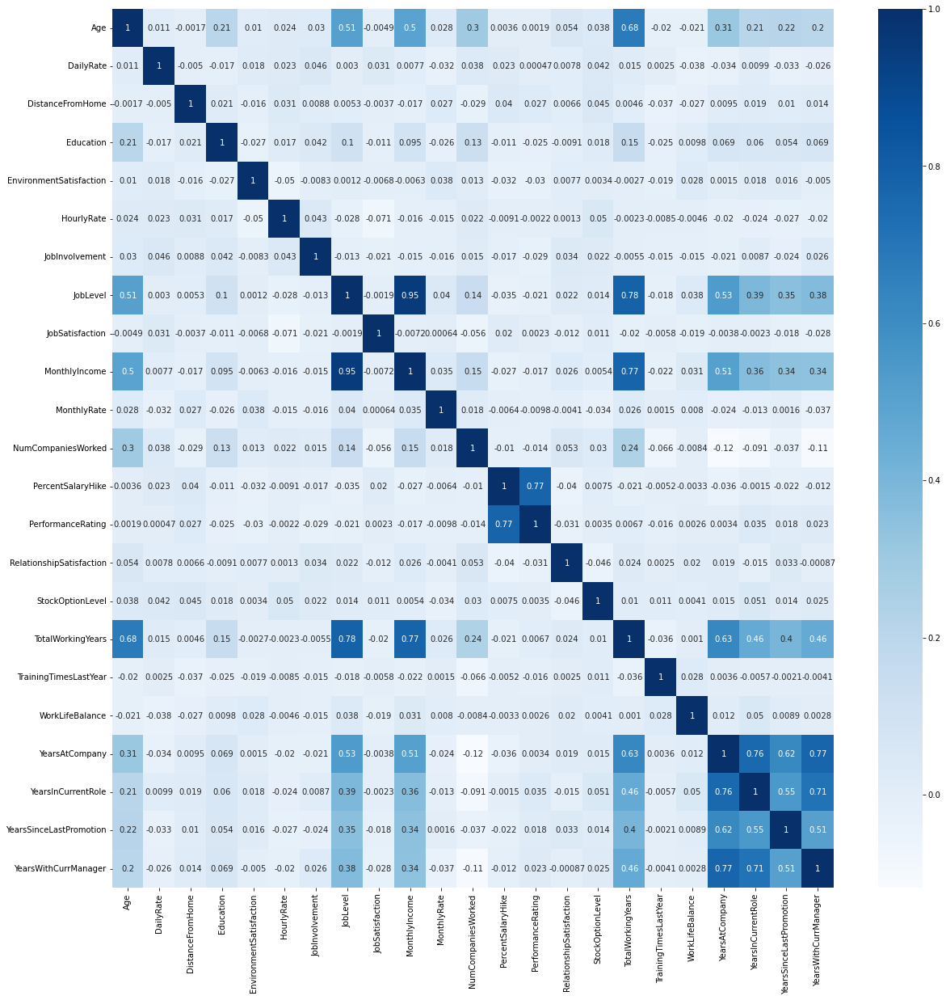

In [209]:
plt.figure(figsize=[20,20])
sns.heatmap(df.corr(), annot = True, cmap='Blues')

1. Monthly income has high correlation with Job level and Working years, Monthly income is also skewed So i decides to drop Monthly Income.
2. Performance Rating and PercentSalaryHike Highly correlated. Performance Rating is also skewed Hence I decided to drop Performance Rating.
3. YearsAtCompany has high correlation with YearsWithCurManager and YearsInCurRole. So i will drop YearsAtCompany and remove the problem of Multicolinearity.

In [210]:
df.drop(['MonthlyIncome', 'PerformanceRating', 'YearsAtCompany'], axis = 1)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,OverTime,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,Yes,11,1,0,8,0,1,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,No,23,4,1,10,3,3,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,Yes,15,2,0,7,3,3,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,Yes,11,3,0,8,3,3,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,No,12,4,1,6,3,3,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,No,17,3,1,17,3,3,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,No,15,1,1,9,5,3,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,Yes,20,2,1,6,0,3,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,No,14,4,0,17,3,2,6,0,8


In [211]:
from sklearn.preprocessing import LabelEncoder
for column in df.columns:
    if df[column].dtype ==np.number:
        continue
    else:
        df[column]=LabelEncoder().fit_transform(df[column])

In [212]:
from scipy.stats import zscore
z=np.abs(zscore(df))

threshold=3
print(np.where(z>3))

df_new=df[(z<3).all(axis=1)]
df_new

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
        123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
        218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
        401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
        561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
        677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
        875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
        962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
       1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
       1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430]), array([30, 29, 27, 29, 28, 29, 24, 24, 27, 29, 28, 29, 30, 24, 27, 29, 30,
       29, 24, 30, 27, 28, 29, 28, 30, 27, 29, 24, 27, 28, 29, 29, 30, 24,
       27, 27, 29, 29, 24, 28, 27, 27, 29, 27, 30, 29, 27, 24, 27, 29, 30,
       24, 30, 27, 29, 27, 30, 29, 28, 28,

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23,1,2,624,2,0,1,1,1,0,...,0,0,0,8,0,0,6,4,0,5
1,31,0,1,113,1,7,0,1,2,1,...,1,3,1,10,3,2,10,7,1,7
2,19,1,2,805,1,1,1,4,3,1,...,0,1,0,7,3,2,0,0,0,0
3,15,0,1,820,1,2,3,1,3,0,...,0,2,0,8,3,2,8,7,3,0
4,9,0,2,312,1,1,0,3,0,1,...,0,3,1,6,3,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18,0,1,494,1,22,1,3,2,1,...,0,2,1,17,3,2,5,2,0,3
1466,21,0,2,327,1,5,0,3,3,1,...,0,0,1,9,5,2,7,7,1,7
1467,9,0,2,39,1,3,2,1,1,1,...,1,1,1,6,0,2,6,2,0,3
1468,31,0,1,579,2,1,2,3,3,1,...,0,3,0,17,3,1,9,6,0,8


There are only 13 rows getting reduced after removing the outliers. Hence we can surely afford to move with this new data.

In [213]:
df_new['New_age'] = df_new['Age']

In [214]:
df_new.drop('Age', axis=1, inplace=True)

In [215]:
df_new

,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,New_age
0,1,2,624,2,0,1,1,1,0,64,...,0,0,8,0,0,6,4,0,5,23
1,0,1,113,1,7,0,1,2,1,31,...,3,1,10,3,2,10,7,1,7,31
2,1,2,805,1,1,1,4,3,1,62,...,1,0,7,3,2,0,0,0,0,19
3,0,1,820,1,2,3,1,3,0,26,...,2,0,8,3,2,8,7,3,0,15
4,0,2,312,1,1,0,3,0,1,10,...,3,1,6,3,2,2,2,2,2,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,494,1,22,1,3,2,1,11,...,2,1,17,3,2,5,2,0,3,18
1466,0,2,327,1,5,0,3,3,1,12,...,0,1,9,5,2,7,7,1,7,21
1467,0,2,39,1,3,2,1,1,1,57,...,1,1,6,0,2,6,2,0,3,9
1468,0,1,579,2,1,2,3,3,1,33,...,3,0,17,3,1,9,6,0,8,31


In [216]:
dfx = df_new.iloc[:,1:]
dfx

,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,New_age
0,2,624,2,0,1,1,1,0,64,2,...,0,0,8,0,0,6,4,0,5,23
1,1,113,1,7,0,1,2,1,31,1,...,3,1,10,3,2,10,7,1,7,31
2,2,805,1,1,1,4,3,1,62,1,...,1,0,7,3,2,0,0,0,0,19
3,1,820,1,2,3,1,3,0,26,2,...,2,0,8,3,2,8,7,3,0,15
4,2,312,1,1,0,3,0,1,10,2,...,3,1,6,3,2,2,2,2,2,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,1,494,1,22,1,3,2,1,11,3,...,2,1,17,3,2,5,2,0,3,18
1466,2,327,1,5,0,3,3,1,12,1,...,0,1,9,5,2,7,7,1,7,21
1467,2,39,1,3,2,1,1,1,57,3,...,1,1,6,0,2,6,2,0,3,9
1468,1,579,2,1,2,3,3,1,33,1,...,3,0,17,3,1,9,6,0,8,31


In [217]:
dfy = df_new.iloc[:,0]
dfy

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1387, dtype: int64

In [218]:
from imblearn.over_sampling import SMOTE

In [219]:
sm = SMOTE()

In [220]:
trainx, trainy = sm.fit_resample(dfx, dfy)

In [221]:
trainy.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

In [225]:
trainx

,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,New_age
0,2,624,2,0,1,1,1,0,64,2,...,0,0,8,0,0,6,4,0,5,23
1,1,113,1,7,0,1,2,1,31,1,...,3,1,10,3,2,10,7,1,7,31
2,2,805,1,1,1,4,3,1,62,1,...,1,0,7,3,2,0,0,0,0,19
3,1,820,1,2,3,1,3,0,26,2,...,2,0,8,3,2,8,7,3,0,15
4,2,312,1,1,0,3,0,1,10,2,...,3,1,6,3,2,2,2,2,2,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,1,90,0,20,0,0,2,1,29,0,...,2,0,0,1,2,0,0,0,0,5
2312,1,857,2,1,0,4,0,0,31,2,...,1,0,6,3,2,4,2,1,3,7
2313,1,92,1,19,1,3,1,1,45,1,...,1,0,4,2,2,3,2,0,2,9
2314,2,227,1,10,1,2,0,0,20,1,...,0,0,7,3,1,5,4,0,4,12


In [226]:
from sklearn.preprocessing import StandardScaler

sv = StandardScaler()
x = sv.fit_transform(trainx)
x = pd.DataFrame(x)

In [227]:
x

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,0.747956,0.778762,1.511711,-1.133820,-0.737466,-0.894911,-0.436275,-1.047772,1.520637,0.640562,...,-1.428068,-0.748332,-0.165370,-2.131668,-2.150022,0.158764,0.241431,-0.693772,0.585299,0.706697
1,-0.790468,-1.243785,-0.365567,-0.216900,-1.762659,-0.894911,0.489011,0.954406,-0.219615,-0.706887,...,1.421506,0.509387,0.153263,0.345888,0.554731,1.079156,1.234011,-0.273040,1.244294,1.627232
2,0.747956,1.495163,-0.365567,-1.002832,-0.737466,1.487403,1.414298,0.954406,1.415168,-0.706887,...,-0.478210,-0.748332,-0.324687,0.345888,0.554731,-1.221825,-1.082009,-0.693772,-1.062188,0.246430
3,-0.790468,1.554533,-0.365567,-0.871843,1.312920,-0.894911,1.414298,-1.047772,-0.483290,0.640562,...,0.471648,-0.748332,-0.165370,0.345888,0.554731,0.618960,1.234011,0.568424,-1.062188,-0.213837
4,0.747956,-0.456139,-0.365567,-1.002832,-1.762659,0.693299,-1.361561,0.954406,-1.327048,0.640562,...,1.421506,0.509387,-0.484003,0.345888,0.554731,-0.761629,-0.420289,0.147692,-0.403193,-0.904238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,-0.790468,-1.334819,-2.242844,1.485951,-1.762659,-1.689016,0.489011,0.954406,-0.325085,-2.054337,...,0.471648,-0.748332,-1.439902,-1.305816,0.554731,-1.221825,-1.082009,-0.693772,-1.062188,-1.364506
2312,-0.790468,1.700980,1.511711,-1.002832,-1.762659,1.487403,-1.361561,-1.047772,-0.219615,0.640562,...,-0.478210,-0.748332,-0.484003,0.345888,0.554731,-0.301432,-0.420289,-0.273040,-0.073696,-1.134372
2313,-0.790468,-1.326903,-0.365567,1.354962,-0.737466,0.693299,-0.436275,0.954406,0.518674,-0.706887,...,-0.478210,-0.748332,-0.802636,-0.479964,0.554731,-0.531531,-0.420289,-0.693772,-0.403193,-0.904238
2314,0.747956,-0.792571,-0.365567,0.176065,-0.737466,-0.100806,-1.361561,-1.047772,-0.799699,-0.706887,...,-1.428068,-0.748332,-0.324687,0.345888,-0.797645,-0.071334,0.241431,-0.693772,0.255802,-0.559038


In [229]:
maxscore=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,trainy,test_size=0.3, random_state=i)
    mod = LogisticRegression()
    mod.fit(x_train,y_train)
    pred = mod.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxscore:
        maxscore=acc
        maxRS=i
print("Best accuracy score is ", maxscore, 'on Random state ', maxRS)

Best accuracy score is  0.8618705035971223 on Random state  132


In [230]:
x_train,x_test,y_train,y_test=train_test_split(x,trainy,test_size=0.3, random_state=132)

In [232]:
x_train.shape

(1621, 30)

In [234]:
y_train.shape

(1621,)

In [236]:
x_test.shape

(695, 30)

In [238]:
y_test.shape

(695,)

In [241]:
model=[DecisionTreeClassifier(),SVC(),KNeighborsClassifier(), RandomForestClassifier(), LogisticRegression()]

for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    m_pred=m.predict(x_test)
    print('accuracy_score of',m,"is:")
    print(accuracy_score(y_test,m_pred))
    print(confusion_matrix(y_test,m_pred))
    print(classification_report(y_test,m_pred))
    print("\n")

accuracy_score of DecisionTreeClassifier() is:
0.8158273381294964
[[252  72]
 [ 56 315]]
              precision    recall  f1-score   support

           0       0.82      0.78      0.80       324
           1       0.81      0.85      0.83       371

    accuracy                           0.82       695
   macro avg       0.82      0.81      0.81       695
weighted avg       0.82      0.82      0.82       695



accuracy_score of SVC() is:
0.8906474820143885
[[294  30]
 [ 46 325]]
              precision    recall  f1-score   support

           0       0.86      0.91      0.89       324
           1       0.92      0.88      0.90       371

    accuracy                           0.89       695
   macro avg       0.89      0.89      0.89       695
weighted avg       0.89      0.89      0.89       695



accuracy_score of KNeighborsClassifier() is:
0.8561151079136691
[[232  92]
 [  8 363]]
              precision    recall  f1-score   support

           0       0.97      0.72      0.

In [243]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
for i in model:
    kfold=KFold(5)
    score=cross_val_score(i,x,trainy,cv=kfold)
    print(i, "CV Score is ",score.mean())

DecisionTreeClassifier() CV Score is  0.7810968570790198
SVC() CV Score is  0.8747905339986595
KNeighborsClassifier() CV Score is  0.8104891263871303
RandomForestClassifier() CV Score is  0.8894615327325537
LogisticRegression() CV Score is  0.7923195799508453


As we can see above, difference between CV score and Accuracy is least in the case of SVC. Hence We will perform hypertuning on this model.

In [244]:
parameter = {'gamma' : [1,0.1,0.01,0.001],
            'kernel' : ['poly', 'rbf', 'sigmoid'],
            'verbose':[True, False],
            'C': [0.1,1, 10, 100]}

In [245]:
GSV = GridSearchCV(SVC(),parameter,cv=10)
GSV.fit(x_train,y_train)

[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['poly', 'rbf', 'sigmoid'],
                         'verbose': [True, False]})

In [246]:
GSV.best_params_

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf', 'verbose': True}

In [250]:
Final_model=SVC(C=10, gamma=0.1, kernel='rbf', verbose= True, probability=True)
Final_model.fit(x_train,y_train)
Final_model.score(x_train,y_train)
pred=Final_model.predict(x_test)
print(accuracy_score(y_test,pred)*100)
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[LibSVM]93.9568345323741
[[311  13]
 [ 29 342]]
              precision    recall  f1-score   support

           0       0.91      0.96      0.94       324
           1       0.96      0.92      0.94       371

    accuracy                           0.94       695
   macro avg       0.94      0.94      0.94       695
weighted avg       0.94      0.94      0.94       695



With the of hypertunig we have achiver 94% accuracy score, which is great.

In [248]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

In [251]:
y_pred_prob=Final_model.predict_proba(x_test)[:,1]
y_pred_prob

array([9.99999759e-01, 3.38008592e-02, 9.95150307e-01, 1.44199302e-02,
       9.99999993e-01, 5.17920867e-02, 2.70839531e-02, 4.99532583e-02,
       7.34619938e-01, 4.04036228e-02, 3.06379961e-01, 9.53360063e-01,
       2.25576253e-03, 9.33934453e-01, 6.31427058e-03, 6.03733920e-02,
       3.86336686e-03, 9.99982942e-01, 9.74359068e-01, 9.99996351e-01,
       9.88287716e-01, 1.76143098e-02, 9.80987268e-01, 7.81157835e-02,
       1.54197425e-02, 4.37006016e-01, 9.99993782e-01, 8.01118437e-03,
       9.99996556e-01, 9.95090085e-01, 6.63759583e-01, 3.58526414e-03,
       5.90412195e-03, 9.83651702e-01, 9.99999987e-01, 9.20755786e-01,
       2.90394308e-02, 1.27831236e-01, 9.99999548e-01, 8.86960375e-01,
       1.36991685e-02, 2.86014322e-03, 1.45559689e-01, 9.99999998e-01,
       7.13527776e-02, 2.40396046e-02, 9.99993990e-01, 9.99986749e-01,
       9.90374711e-01, 9.99999995e-01, 2.04891860e-03, 1.22880094e-02,
       6.14116557e-01, 9.99999986e-01, 4.79885138e-02, 6.81792920e-03,
      

In [252]:
len(y_pred_prob)

695

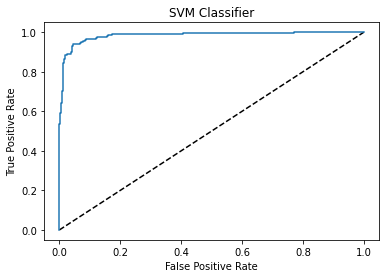

AUC_ROC Score =  0.9408547136534557


In [253]:
fpr,tpr,threshold=roc_curve(y_test,y_pred_prob)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='SVM Classifier ')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVM Classifier')
plt.show()
auc_score=roc_auc_score(y_test,Final_model.predict(x_test))
print('AUC_ROC Score = ',auc_score)

In [255]:
import joblib
joblib.dump(Final_model,'HR Analytics.obj')

['HR Analytics.obj']

In [267]:
import numpy as np
A = np.array(y_test)
Predicted = np.array(m.predict(x_test))
df_com = pd.DataFrame({"Original":A, "Predicted":Predicted})
df_com

,Original,Predicted
0,1,1
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
690,0,0
691,0,0
692,1,1
693,1,1


Printed the actual output comparing the predicted output.